In [12]:
import os
import numpy as np

import pickle

from itertools import combinations

import matplotlib.pyplot as plt
import plotly.express as px

import pandas as pd
from pandas import DataFrame

from sklearn.decomposition import PCA
from sklearn import datasets
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import resample

import seaborn as sns


In [13]:
# Determine script path
SCRIPT_PATH = os.getcwd()
print(f"Running in path: ${SCRIPT_PATH}")

# VARS

# Generate and show plots?
# GENERATE_PLOTS=True
GENERATE_PLOTS=True

# Datasets

# https://www.kaggle.com/datasets/kukuroo3/body-performance-data
filepath_bodyPerformance = "../datasets/bodyPerformance.csv"

# https://www.kaggle.com/datasets/jmcaro/wheat-seedsuci
filepath_seeds = "../datasets/seeds.csv"

# COMMON DATASET SETTINGS
NUMBER_DATASETS = 5
NUMBER_RUNS = 10
TEST_SIZE = 0.2

N_SAMPLES = 1000
N_FEATURES=5 
N_CLASSES=4

# FILES (Output)
DATASET_FILE = 'generated_datasets.data'
FEATUREMAP_FILE = 'generated_feature_maps.data'


Running in path: $/Users/phuber/git/ZHAW/BA/Quantum-Machine-Learning/code/svm


In [14]:
# Functions

def load_data(filename):
    with open(filename, 'rb') as filehandle:
        # read the data as binary data stream
        return pickle.load(filehandle)

def store_data(data, filename):  
    with open(filename, 'wb') as filehandle:
        # store the data as binary data stream
        pickle.dump(data, filehandle)

def verify_datasets_integrity(data_sets: list, number_datasets: int, number_samples: int, number_runs: int):
    # check if number of samples[train + test] is equal to number of samples as expected
    for d in data_sets:
        assert d[2][1].shape[0]+d[2][2].shape[0] == number_samples, "data corruption detected"
    # check if number of dataset being generated is as expected
    assert len(data_sets)==number_datasets*number_runs

def verify_featuremap_set_integrity(datasets,featuremaps):
    for fm in featuremaps:
        assert len(datasets) == len(fm), "Dimesions not equal."

def add_set_label(label, data_sets) -> list:
    '''
    prepends: global set-id and given label
    [[0, '<dataset name>', ( array([...]), 
                             array([...]), 
                             array([...]), 
                             array([...]) 
                            )
    ]],
    e.g.,
    '''
    result: list = []
    for x in data_sets:
        result.append([add_set_label.set_id,label,x])
        add_set_label.set_id +=1
    return result

def preprocess_data(data, labels, scale_range: tuple = (-1, 1), test_size: float=0.2) ->  tuple:
    '''
    1. train test split
    2. normalise samples each
    3. scale samples each 
    '''
    sample_train, sample_test, label_train, label_test = train_test_split(
         data,labels, test_size=test_size)

    # Normalise
    std_scale: StandardScaler = StandardScaler().fit(sample_train)
    sample_train = std_scale.transform(sample_train)
    sample_test = std_scale.transform(sample_test)

    # Scale
    samples = np.append(sample_train, sample_test, axis=0)
    minmax_scale: MinMaxScaler = MinMaxScaler(scale_range).fit(samples)
    sample_train = minmax_scale.transform(sample_train)
    sample_test = minmax_scale.transform(sample_test)
    
    return sample_train, sample_test, label_train, label_test
  

def prepare_data(data, labels, number_runs=NUMBER_RUNS, n_samples=N_SAMPLES):
    '''
    1. reshuffle given data
    2. split in test and train datasets, according to settings in global settings section
       repeats process and creates `number_runs` datasets
       returns datasets
    '''
    print("data.shape", data.shape)
    shuffle_sample_count = min(data.shape[0], n_samples)
    print("shuffle_sample_count", shuffle_sample_count)
    # helper functions
    attach_column = lambda x,y: np.concatenate((x,np.reshape(y,(-1,1))),axis=1)
    reshuffle = lambda x: resample(x, n_samples=shuffle_sample_count, replace=False)
    # reshuffle and split, normalize, ...
    reshuffled = [reshuffle(attach_column(data,labels)) for x in range(number_runs)]
    return [preprocess_data(x[:,:-1],x[:,-1]) for x in reshuffled]


In [15]:
# init set id
add_set_label.set_id = 0

## Dataset: Body Performance

In [16]:
# body Performance
data = pd.read_csv(filepath_bodyPerformance).dropna()
new_data = data.drop(columns=['gender'])
print(f"shape: {new_data.shape}")

# data
X_body_perf = new_data.iloc[: , :-1].copy()

# targets
Y_body_perf = new_data.iloc[: , -1:].copy()
Y_body_perf['class'].replace({"A": 0, "B": 1, "C": 2, "D": 3 }, inplace=True) # remap target labels


shape: (13393, 11)


In [17]:
X_body_perf.head()

,age,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm
0,27.0,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0
1,25.0,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0
2,31.0,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0
3,32.0,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0
4,28.0,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0


max: class    3
dtype: int64
unique: [2 0 1 3]


/Users/phuber/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



,class
0,2
1,0
2,2
3,1
4,1


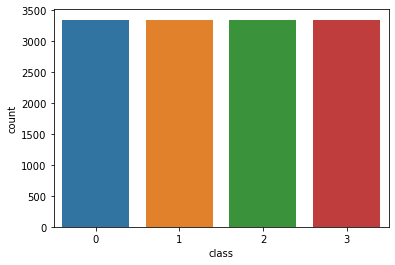

In [18]:
print(f"max: {Y_body_perf.max()}")
print(f"unique: {Y_body_perf['class'].unique()}")

if GENERATE_PLOTS:
  sns.countplot(Y_body_perf['class'])

Y_body_perf.head()

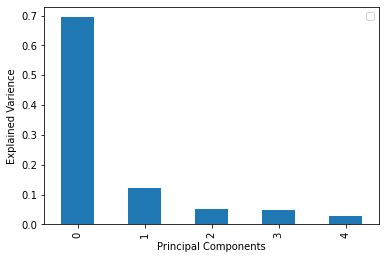

In [19]:
pca = PCA(n_components=5)

X_body_perf_components = pca.fit_transform(X_body_perf)

total_var = pca.explained_variance_ratio_.sum() * 100

if GENERATE_PLOTS:
  pd.DataFrame(pca.explained_variance_ratio_).plot.bar()
  plt.legend('')
  plt.xlabel('Principal Components')
  plt.ylabel('Explained Varience')
  plt.show()
  
  for index, combination in enumerate(list(combinations(np.arange(5), 3))):
    fig = px.scatter_3d(
        X_body_perf_components, x=combination[0], y=combination[1], z=combination[2], color=Y_body_perf['class'],
        title=f'PCA combinations: {combination} (Total explained variance: {total_var:.2f}%)',
        labels={combination[0]: 'PC {}'.format(combination[0]+1),
                combination[1]: 'PC {}'.format(combination[1]+1),
                combination[2]: 'PC {}'.format(combination[2]+1)},
    )
    fig.show()

## Dataset: Seeds

In [20]:
# seeds
data = pd.read_csv(filepath_seeds).dropna()
print(f"shape: {data.shape}")

# data
X_seeds = data.iloc[: , :-1].copy()

# targets
Y_seeds = data.iloc[: , -1:].copy() - 1


shape: (199, 8)


In [21]:
X_seeds.head()

,Area,Perimeter,Compactness,Kernel.Length,Kernel.Width,Asymmetry.Coeff,Kernel.Groove
0,15.26,14.84,0.8710,5.763,3.312,2.221,5.220
1,14.88,14.57,0.8811,5.554,3.333,1.018,4.956
2,14.29,14.09,0.9050,5.291,3.337,2.699,4.825
3,13.84,13.94,0.8955,5.324,3.379,2.259,4.805
4,16.14,14.99,0.9034,5.658,3.562,1.355,5.175


max: Type    2
dtype: int64
unique: [0 1 2]


/Users/phuber/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



,Type
0,0
1,0
2,0
3,0
4,0


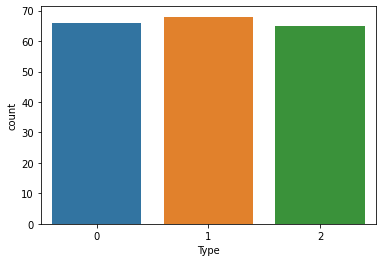

In [22]:
print(f"max: {Y_seeds.max()}")
print(f"unique: {Y_seeds['Type'].unique()}")

if GENERATE_PLOTS:
  sns.countplot(Y_seeds['Type'])

Y_seeds.head()

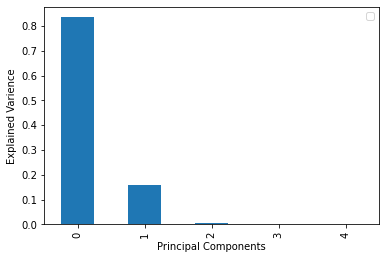

In [23]:
pca = PCA(n_components=5)

X_seeds_components = pca.fit_transform(X_seeds)

total_var = pca.explained_variance_ratio_.sum() * 100

if GENERATE_PLOTS:
  pd.DataFrame(pca.explained_variance_ratio_).plot.bar()
  plt.legend('')
  plt.xlabel('Principal Components')
  plt.ylabel('Explained Varience')
  plt.show()
  
  for index, combination in enumerate(list(combinations(np.arange(5), 3))):
    fig = px.scatter_3d(
        X_seeds_components, x=combination[0], y=combination[1], z=combination[2], color=Y_seeds['Type'],
        title=f'PCA combinations: {combination} (Total explained variance: {total_var:.2f}%)',
        labels={combination[0]: 'PC {}'.format(combination[0]+1),
                combination[1]: 'PC {}'.format(combination[1]+1),
                combination[2]: 'PC {}'.format(combination[2]+1)},
    )
    fig.show()

## Dataset: Iris

In [24]:
# Iris
data: DataFrame = datasets.load_iris(as_frame=True)['frame']
print(f"shape: {data.shape}")

# data

X_iris = data.iloc[: , :-1].copy()

# targets
Y_iris = data.iloc[: , -1:].copy()

shape: (150, 5)


In [25]:
X_iris.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


max: target    2
dtype: int64
unique: [0 1 2]


/Users/phuber/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



,target
0,0
1,0
2,0
3,0
4,0


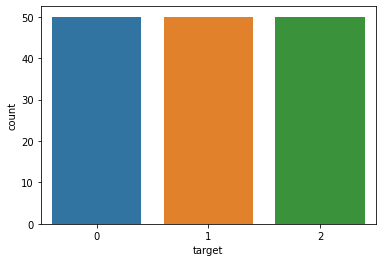

In [26]:
print(f"max: {Y_iris.max()}")
print(f"unique: {Y_iris['target'].unique()}")

if GENERATE_PLOTS:
  sns.countplot(Y_iris['target'])

Y_iris.head()

In [27]:
# Iris: no PCA since there are only 4 features

## Dataset: Artificial Multiclass

In [28]:
# Artificial Multiclass
X_artificial_mc_raw, Y_artificial_mc_raw =datasets.make_classification(
  n_samples=N_SAMPLES, 
  n_features=N_FEATURES,
  n_classes=N_CLASSES,
  n_informative=3,
  shuffle=True,
  n_redundant=0, n_repeated=0, n_clusters_per_class=2,
  class_sep=2, flip_y=0, weights=[0.68]*N_CLASSES
  )

# Make DF
data = pd.merge(left=pd.DataFrame(X_artificial_mc_raw), right=pd.DataFrame(Y_artificial_mc_raw), left_index=True, right_index=True).copy()
data.rename(columns={'0_x':'feature_1', 
  1:'feature_2', 
  2:'feature_3', 
  3:'feature_4', 
  4:'feature_5', 
  '0_y':'targets', 
  }, inplace=True)
data.columns = data.columns.astype(str)

X_artificial_mc = data.iloc[: , :-1].copy()

# targets
Y_artificial_mc = data.iloc[: , -1:].copy()




In [29]:
X_artificial_mc.head()

,feature_1,feature_2,feature_3,feature_4,feature_5
0,2.204544,-0.637024,-2.834338,0.194675,-0.735837
1,-2.236501,-1.125237,2.203671,-0.811251,0.821963
2,-2.087463,-3.331668,0.646646,-0.531605,1.292179
3,-0.950522,-0.794826,-1.611840,-0.769737,0.049032
4,-1.368273,-1.370041,-1.275799,0.910858,1.378203


max: targets    2
dtype: int64
unique: [1 2 0]


/Users/phuber/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



,targets
0,1
1,2
2,2
3,0
4,0


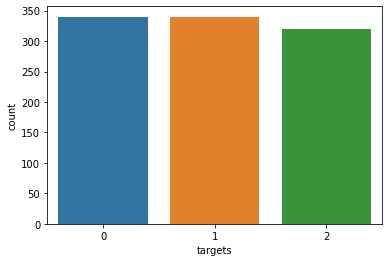

In [30]:
print(f"max: {Y_artificial_mc.max()}")
print(f"unique: {Y_artificial_mc['targets'].unique()}")

if GENERATE_PLOTS:
  sns.countplot(Y_artificial_mc['targets'])

Y_artificial_mc.head()

In [31]:
# Plot
if GENERATE_PLOTS:
  for index, combination in enumerate(list(combinations(['feature_1', 'feature_2', 'feature_3', 'feature_4', 'feature_5'], 3))):
    fig = px.scatter_3d(
        X_artificial_mc, x=combination[0], y=combination[1], z=combination[2], color=Y_artificial_mc['targets'],
        title=f'Feature combinations: {combination}',
        labels={combination[0]: '{}'.format(combination[0]),
                combination[1]: '{}'.format(combination[1]),
                combination[2]: '{}'.format(combination[2])},
    )
    fig.show()

## Dataset: Blobs

In [32]:
# Blobs

X_blobs_raw1, Y_blobs_raw1 = datasets.make_blobs(
  n_samples=N_SAMPLES, 
  n_features=N_FEATURES,
  centers=N_CLASSES,
  shuffle=True,
  cluster_std=1.,
  center_box=(-5.,5.)
  )

# Make DF
left_df = pd.DataFrame(X_blobs_raw1)
right_df = pd.DataFrame(Y_blobs_raw1)
data = pd.merge(left=left_df, right=right_df, left_index=True, right_index=True).copy()
data.rename(columns={'0_x':'feature_1', 
  1:'feature_2', 
  2:'feature_3', 
  3:'feature_4', 
  4:'feature_5', 
  '0_y':'targets', 
  }, inplace=True)
data.columns = data.columns.astype(str)

X_blobs = data.iloc[: , :-1].copy()

# targets
Y_blobs = data.iloc[: , -1:].copy()


In [33]:
X_blobs.head()

,feature_1,feature_2,feature_3,feature_4,feature_5
0,0.636204,1.928842,4.048400,1.509741,1.025129
1,-2.558137,1.850235,3.900445,4.056870,2.890682
2,-2.739329,1.791048,1.240108,1.285906,3.212497
3,4.156376,2.881696,-2.345332,-3.193668,0.533499
4,-0.534388,1.791367,2.434749,2.181200,2.423095


max: targets    3
dtype: int64
unique: [3 2 1 0]


/Users/phuber/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



,targets
0,3
1,3
2,3
3,2
4,3


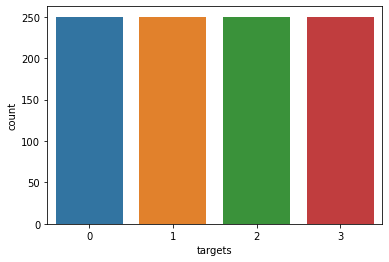

In [34]:
print(f"max: {Y_blobs.max()}")
print(f"unique: {Y_blobs['targets'].unique()}")

if GENERATE_PLOTS:
  sns.countplot(Y_blobs['targets'])

Y_blobs.head()

In [35]:
# Plot
if GENERATE_PLOTS:
  for index, combination in enumerate(list(combinations(['feature_1', 'feature_2', 'feature_3', 'feature_4', 'feature_5'], 3))):
    fig = px.scatter_3d(
        X_blobs, x=combination[0], y=combination[1], z=combination[2], color=Y_blobs['targets'],
        title=f'Feature combinations: {combination}',
        labels={combination[0]: '{}'.format(combination[0]),
                combination[1]: '{}'.format(combination[1]),
                combination[2]: '{}'.format(combination[2])},
    )
    fig.show()

## Store datasets

In [36]:
# Prepare datasets and stor in output file
_body_perf = add_set_label('body-performance',prepare_data(X_body_perf, Y_body_perf))
_seeds = add_set_label('seeds',prepare_data(X_seeds, Y_seeds))
_iris = add_set_label('iris',prepare_data(X_iris, Y_iris))
_artificial_mc = add_set_label('atificial-multiclass',prepare_data(X_artificial_mc, Y_artificial_mc))
_blobs = add_set_label('blobs',prepare_data(X_blobs, Y_blobs))

data_sets = _body_perf + _seeds + _iris + _artificial_mc + _blobs

store_data(data=data_sets,filename=DATASET_FILE)


data.shape (13393, 10)
shuffle_sample_count 1000
data.shape (199, 7)
shuffle_sample_count 199
data.shape (150, 4)
shuffle_sample_count 150
data.shape (1000, 5)
shuffle_sample_count 1000
data.shape (1000, 5)
shuffle_sample_count 1000


In [37]:
# check output file

# todo fix sample count
# verify_datasets_integrity(data_sets,number_datasets=NUMBER_DATASETS,
#                               number_samples=N_SAMPLES,number_runs=NUMBER_RUNS)


In [38]:
# load and print data again
data = load_data(DATASET_FILE)
# print(data)
for index, d in enumerate(data):
  if index % NUMBER_RUNS == 1:
    print(f"{d[0]}: {d[1]} \n data \n - train: {d[2][0][:1]} \n - test: {d[2][1][:1]} \n targets \n - train: {d[2][2][:3]} \n - test: {d[2][3][:3]}\n")
  #print(f"{d[0]}: ${d[1]} | data: ${d[2]} | targets: ${d[3]}")

1: body-performance 
 data 
 - train: [[ 0.58139535 -0.13432836 -0.06961326  0.05936073  0.29268293 -0.02
  -0.45481928  0.47761194 -0.30769231 -0.40614334]] 
 - test: [[ 0.53488372 -0.23240938 -0.26519337  0.04109589 -0.24390244 -0.78
  -0.33433735  0.08955224 -0.25641026 -0.38566553]] 
 targets 
 - train: [2. 0. 2.] 
 - test: [3. 2. 1.]

11: seeds 
 data 
 - train: [[-0.39376771 -0.32644628  0.29401089 -0.46283784 -0.25160371 -0.78942767
  -0.56474643]] 
 - test: [[ 0.04815864  0.0661157   0.72958258 -0.14527027  0.32858161 -0.84373303
  -0.3540128 ]] 
 targets 
 - train: [0. 1. 0.] 
 - test: [0. 1. 2.]

21: iris 
 data 
 - train: [[ 0.11111111 -0.25        0.55932203  0.41666667]] 
 - test: [[ 0.33333333 -0.58333333  0.62711864  0.41666667]] 
 targets 
 - train: [2. 1. 1.] 
 - test: [2. 0. 2.]

31: atificial-multiclass 
 data 
 - train: [[-0.44968858  0.0929099  -0.40596847 -0.29965949 -0.50374332]] 
 - test: [[-0.29142173  0.30459356 -0.46571697  0.54043019  0.11147266]] 
 targets 